# **Convolutional Network & Transfer Learning**

# Dataset: Leaf (White Spots, Algal Leaf, Brown Blight)
## Use of Keras Tuner
## Transfer Learning Model
• ResNet50V2
• ResNet101V2
• VGG16
• VGG19


## Connected to Google Drive

Data files are kept on Google Drive hence connecting to Google Drive to refer to the data file (zip).

In [ ]:
# Connect Google Drive
from google.colab import drive
drive.mount('/content/gdrive/', force_remount=True)

Mounted at /content/gdrive/


## Download and Unzip Data file

The data file located on Google Drive as a zip file has been unzipped into the Google Colab environment. This step was taken to reduce latency and improve the performance of dataload process which in turn reduces computing resources.

In [ ]:
import zipfile


source_dir = '/content/gdrive/MyDrive/DS5104/FinalAssignment01/Data_A1.zip'
target_dir = '/content/Dataset'

zip_ref = zipfile.ZipFile(source_dir, 'r')
zip_ref.extractall(target_dir)
zip_ref.close()

## Load Libraries

In [ ]:
# Common
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from IPython.display import clear_output as cls
import datetime
import shutil

# Data
from tqdm import tqdm
from glob import glob
import tensorflow.data as tfd

# Data Visualization
import plotly.express as px
import matplotlib.pyplot as plt
from PIL import Image

# Model
from tensorflow import keras
from keras.models import load_model
from tensorflow.keras import layers
from tensorflow.keras import callbacks
from tensorflow.keras import applications as tka
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
# Install Keras Tuner
!pip install keras_tuner
import keras_tuner as kt
cls()

## Global Parameters

In [ ]:
# Locations
tensorboard_log_dir = '/content/gdrive/MyDrive/DS5104/FinalAssignment01/Log/'
diseases_tea_leaf_dir = '/content/Dataset/Data_A1/'
model_dir = '/content/gdrive/MyDrive/DS5104/FinalAssignment01/Model/'
figure_dir = '/content/gdrive/MyDrive/DS5104/FinalAssignment01/figures/'

# original dataset
original_dataset_path = '/content/gdrive/MyDrive/DS5104/FinalAssignment01/Data_A1'

# augmented images
augmented_dataset_path = '/content/gdrive/MyDrive/DS5104/FinalAssignment01/Data_A1_Augmented'

In [ ]:
# CNN Related Parameters
# The batch size
BATCH_SIZE = 128

# Image Dims
IMAGE_SIZE = (224,224)



## Housekeeping

In [ ]:
# Clear any logs from previous runs
!rm -rf tensorboard_log_dir

In [ ]:
# Setting the Random Seeds
np.random.seed(1024)
tf.random.set_seed(1024)

## Data Load

In machine learning, it's advisable to split your dataset into training, validation, and testing sets with unique data to assess your model's performance accurately and ensure it generalizes well to unseen data. However, due to limited data split is limited for training and validation.

In [ ]:
# Preprocessing
datagen = ImageDataGenerator(rescale=1.0 / 255,  # Normalize pixel values to [0, 1]
                            #rotation_range=20,  # Data augmentation options
                            #width_shift_range=0.2,
                            #height_shift_range=0.2,
                            #shear_range=0.2,
                            #zoom_range=0.2,
                            #horizontal_flip=True,
                            #vertical_flip=True,
                            validation_split=0.2,
                            fill_mode='nearest')


Initial runs with augmented data resulted in low validation accuracy. Looking at training accuracy (which is high) and validation accuracy (Low with a greater gap) highlights that the model is struggling with generalisation. Therefore, it was decided to find the best model with an as-is dataset and later to run the same model on an augmented much larger dataset.

In [ ]:
# Dataload for Training, validation, and testing
train_dataset = datagen.flow_from_directory(diseases_tea_leaf_dir,
                                            target_size=IMAGE_SIZE,
                                            batch_size=BATCH_SIZE,
                                            shuffle=True,
                                            color_mode='rgb',
                                            class_mode='categorical',
                                            subset='training'
                                            )

validation_dataset = datagen.flow_from_directory(diseases_tea_leaf_dir,
                                                 target_size=IMAGE_SIZE,
                                                 batch_size=BATCH_SIZE,
                                                 shuffle=True,
                                                 color_mode='rgb',
                                                 class_mode='categorical',
                                                 subset='validation'
                                                 )

test_dataset = datagen.flow_from_directory(diseases_tea_leaf_dir,
                                           target_size=IMAGE_SIZE,
                                           batch_size=BATCH_SIZE,
                                           color_mode='rgb',
                                           class_mode='categorical'
                                           )

Found 296 images belonging to 3 classes.
Found 72 images belonging to 3 classes.
Found 368 images belonging to 3 classes.


The above results illustrate the following,
* The training dataset has 296 images within 3 classes.
* The validation dataset has 72 images within 3 classes.
* The test dataset has 368 (296 + 72) images within 3 classes.

In [ ]:
class_labels = list(train_dataset.class_indices.keys())
n_classes = train_dataset.num_classes
print(f'Classes: {class_labels}')
print(f'No of classes: {n_classes}')

Classes: ['algal leaf', 'brown blight', 'white spot']
No of classes: 3


## Data Visualization

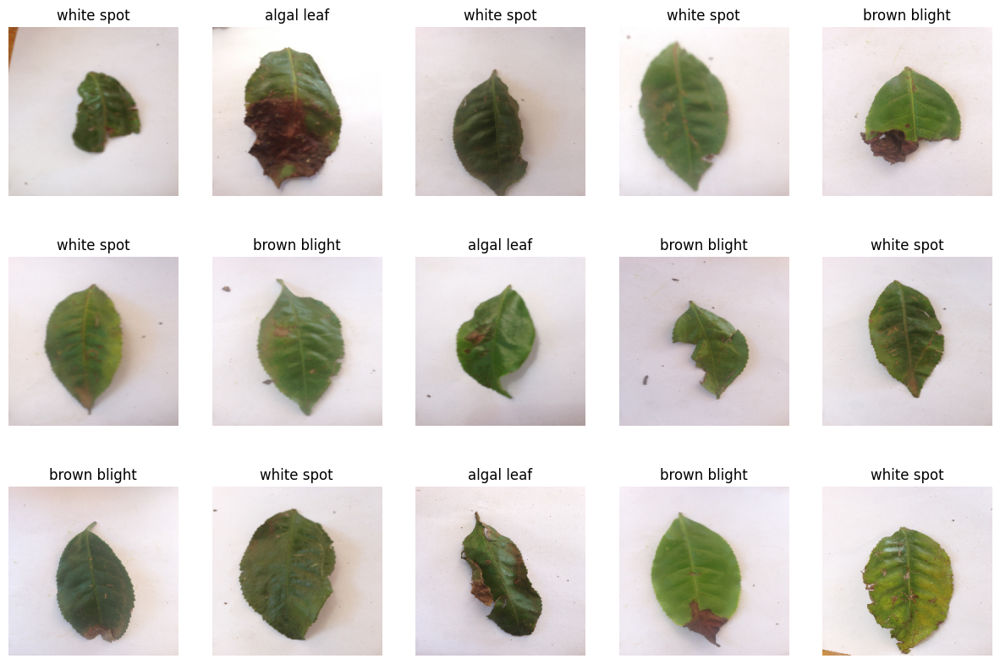

In [ ]:
# Plot a batch of preprocessed images (for visualization)
images, labels = next(train_dataset)
plt.figure(figsize=(15, 10))
for i in range(15):
    plt.subplot(3, 5, i + 1)
    plt.imshow(images[i])
    plt.title(class_labels[np.argmax(labels[i])])
    plt.axis('off')

cls()

## Model 1 - CNN without transfer learning

Under this section, I intend to build a CNN classification model from scratch to predict 3 classes of tea leaf diseases.

I deployed Keras Tuner to find the best model and optimise its hyperparameters. Model layers and the number of nodes were configured based on past experiences in order to achieve the best accuracy.

In [ ]:
def build_model(hp):
  # Initialize the model in sequential
  model = keras.Sequential()
  # Adding first convolutional layer
  model.add(layers.Conv2D(
      filters=hp.Int('conv_1_filter', min_value=64, max_value=256, step=64),
      kernel_size=hp.Choice('conv_1_kernel', values=[3,5]),
      activation='relu',
      input_shape=(*IMAGE_SIZE,3)
  ))
  # Adding first pooling layer
  model.add(layers.MaxPool2D(
      pool_size=(hp.Int('pool_1_size', min_value=2, max_value=3, step=1),
      hp.Int('pool_1_size', min_value=2, max_value=3, step=1))
  ))

  # Adding multiple convolutional and pooling layers
  for i in range(hp.Choice('n_conv_layers', values=[1,2,3])):
    model.add(layers.Conv2D(
        filters=hp.Int(f'conv_{i+2}_filter', min_value=64, max_value=256, step=64),
        kernel_size=hp.Choice(f'conv_{i+2}_kernel', values=[3,5]),
        activation='relu',
    ))
    model.add(layers.MaxPool2D(
        pool_size=(hp.Int(f'pool_{i+2}_size', min_value=2, max_value=3, step=1),
        hp.Int(f'pool_{i+1}_size', min_value=2, max_value=3, step=1))
    ))

  model.add(layers.Flatten())

  # Adding multiple FC layers
  for i in range(hp.Int('n_FC_layers', min_value=1, max_value=2, step=1)):
    model.add(layers.Dense(hp.Choice(f'{i+1}_FC_layer', values=[64, 128, 256]),
                           activation='relu'))


  model.add(layers.Dropout(hp.Choice('dropout_layer', values=[0.2, 0.3])))
  #model.add(layers.BatchNormalization())

  # Adding output layer
  model.add(layers.Dense(n_classes, activation='softmax'))


  # Compile the model
  model.compile(loss='categorical_crossentropy',
                optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),
                metrics=['accuracy'])


  return model



In [ ]:
# Initialize tuner
tuner = kt.RandomSearch(hypermodel=build_model, objective='val_loss', project_name='cnn_model_01')

# Start hyperparameter search.
tuner.search(
    train_dataset,
    validation_data=validation_dataset,
    epochs = 10
)

Trial 10 Complete [00h 00m 37s]
val_loss: 1.0235652923583984

Best val_loss So Far: 0.9380598068237305
Total elapsed time: 00h 05m 57s


### List all hyperparameters tuned by Keras Tuner

In [ ]:

best_hps = tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values


for key, value in best_hps.items():
    print(f"{key}: {value}")

conv_1_filter: 128
conv_1_kernel: 3
pool_1_size: 2
n_conv_layers: 3
conv_2_filter: 128
conv_2_kernel: 5
pool_2_size: 2
n_FC_layers: 1
1_FC_layer: 64
dropout_layer: 0.2
learning_rate: 0.0001
conv_3_filter: 256
conv_3_kernel: 5
pool_3_size: 2
conv_4_filter: 128
conv_4_kernel: 3
pool_4_size: 2
2_FC_layer: 64


### Build the Best Model based on Hyperparameter tuning

In [ ]:
model_01 = tuner.get_best_models()[0]
model_01.build(input_shape=(*IMAGE_SIZE, 3))
# Best Model Summary
model_01.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 128)     0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 107, 107, 128)     409728    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 49, 49, 256)       819456    
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 24, 24, 256)       0

## Train the model

This section will train and validate the model.
Callback functions are created to save the model, collect logs for TensorBoard and early stopping of training.

In [ ]:
# Training the model
model_01_history = model_01.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=100,
    callbacks = [
        callbacks.EarlyStopping(patience=5, restore_best_weights=True),
        callbacks.ModelCheckpoint(f'{model_dir}model_01.h5', save_best_only=True),
        callbacks.TensorBoard(f'{tensorboard_log_dir}{datetime.datetime.now().strftime("%Y%m%d-%H%M%S")}', histogram_freq=1)
    ]
)

Epoch 1/100
3/3 [==============================] - 6s 2s/step - loss: 0.3593 - accuracy: 0.8615 - val_loss: 0.4975 - val_accuracy: 0.7639
Epoch 2/100
3/3 [==============================] - 5s 2s/step - loss: 0.3530 - accuracy: 0.8682 - val_loss: 0.5416 - val_accuracy: 0.7639
Epoch 3/100
3/3 [==============================] - 4s 1s/step - loss: 0.3693 - accuracy: 0.8412 - val_loss: 0.5372 - val_accuracy: 0.7778
Epoch 4/100
3/3 [==============================] - 4s 1s/step - loss: 0.3496 - accuracy: 0.8378 - val_loss: 0.5176 - val_accuracy: 0.7917
Epoch 5/100
3/3 [==============================] - 4s 2s/step - loss: 0.3552 - accuracy: 0.8480 - val_loss: 0.4870 - val_accuracy: 0.7222
Epoch 6/100
3/3 [==============================] - 3s 984ms/step - loss: 0.3696 - accuracy: 0.8682 - val_loss: 0.5688 - val_accuracy: 0.7917
Epoch 7/100
3/3 [==============================] - 3s 1s/step - loss: 0.3048 - accuracy: 0.8851 - val_loss: 0.4546 - val_accuracy: 0.7778
Epoch 8/100
3/3 [==============

In [ ]:
# Valid Data
score = model_01.evaluate(validation_dataset)

print('Validation loss:', score[0])
print('Validation accuracy:', score[1])

1/1 [==============================] - 1s 1s/step - loss: 0.4394 - accuracy: 0.7917
Validation loss: 0.4394097328186035
Validation accuracy: 0.7916666865348816


In [ ]:
# Test data
score = model_01.evaluate(test_dataset)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

3/3 [==============================] - 11s 5s/step - loss: 0.2647 - accuracy: 0.9049
Test loss: 0.26473289728164673
Test accuracy: 0.904891312122345


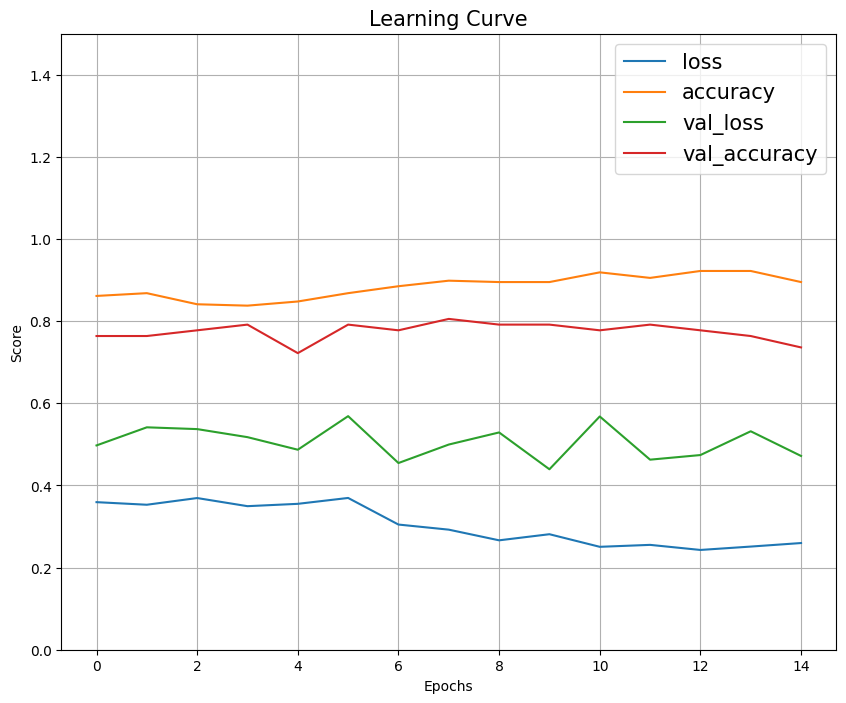

In [ ]:
pd.DataFrame(model_01_history.history).plot(figsize=(10,8))
plt.title("Learning Curve", fontsize=15)
plt.legend(fontsize=15)
plt.ylim([0,1.5])
plt.ylabel('Score')
plt.xlabel('Epochs')
plt.grid()
plt.show()

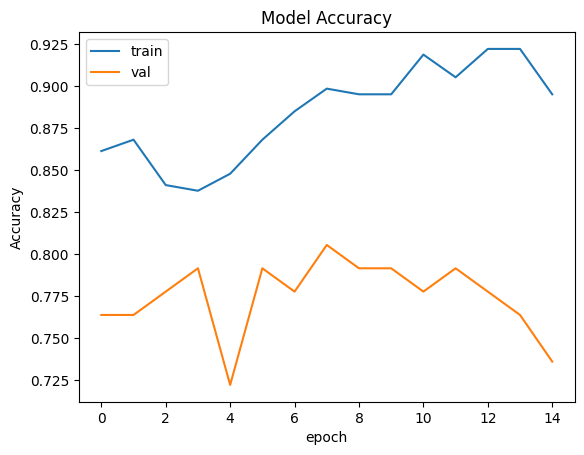

In [ ]:
# Accuracy vs Epoch plot
plt.plot(model_01_history.history['accuracy'])
plt.plot(model_01_history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

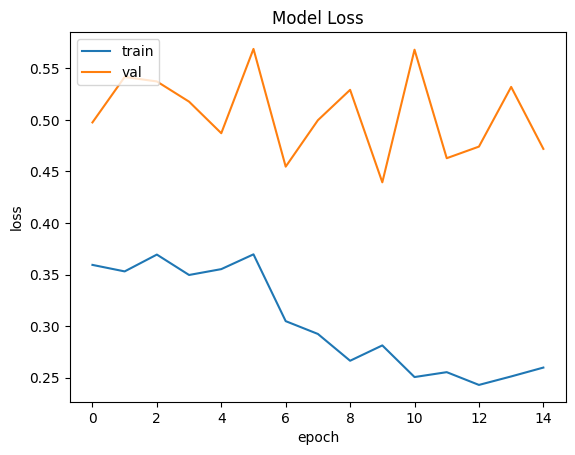

In [ ]:
# Loss vs Epoch plot
plt.plot(model_01_history.history['loss'])
plt.plot(model_01_history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

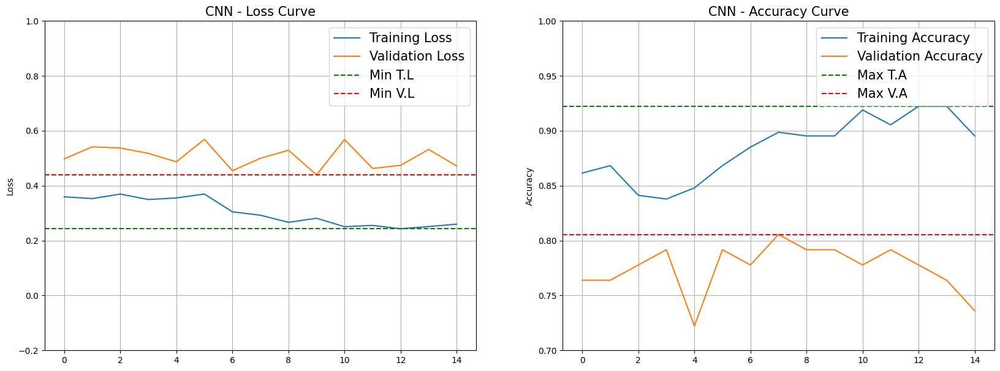

In [ ]:
# Plotting configurations
plt.figure(figsize=(20, 7))

# subplot of the Backbone Learning curve.
plt.subplot(1, 2, 1)
plt.title("CNN - Loss Curve", fontsize=15)
plt.plot(model_01_history.history['loss'], label="Training Loss")
plt.plot(model_01_history.history['val_loss'], label="Validation Loss")
plt.axhline(y=min(model_01_history.history['loss']), label="Min T.L", color='g', linestyle='--')
plt.axhline(y=min(model_01_history.history['val_loss']), label="Min V.L", color='r', linestyle='--')
plt.ylabel("Loss")
plt.legend(fontsize=15)
plt.grid()
plt.ylim(bottom=-0.2, top=1)

plt.subplot(1, 2, 2)
plt.title("CNN - Accuracy Curve", fontsize=15)
plt.plot(model_01_history.history['accuracy'], label="Training Accuracy")
plt.plot(model_01_history.history['val_accuracy'], label="Validation Accuracy")
plt.axhline(y=max(model_01_history.history['accuracy']), label="Max T.A", color='g', linestyle='--')
plt.axhline(y=max(model_01_history.history['val_accuracy']), label="Max V.A", color='r', linestyle='--')
plt.ylabel("Accuracy")
plt.legend(fontsize=15)
plt.grid()
plt.ylim(bottom=0.7, top=1)


# show the final plot.
plt.savefig(f'{figure_dir}CNN_LOSS_and_Accuracy.png')
plt.show()

## **Conclusion** - Model 01

Model 01 is a CNN Classification model from scratch to predict 3 tea leaf diseases. Design model provide 0.79 validation accuracy and 0.90 test accuracy.

During training, model 01 reached the test accuracy of 0.95 but failed to reach higher validation accuracy. The maximum validation accuracy model achieved is just above 0.80. The gap between training and validation accuracy highlights our initial suspicion of less training data.

## Model 2 - With Transfer Learning (VGG and ResNet)

In this section, I will train the CNN model using the following pre-train network for feature extraction.

* ResNet50V2
* ResNet101V2
* VGG16
* VGG19

Fully connected (FC) layers are designed similarly to model 01 (without a pre-train network) so that it allows like-to-like comparison of capabilities of pre-train networks.

In [ ]:
# All the backbones will be accessed through a name.
BACKBONE_NAMES = [
    'ResNet50V2',
    'ResNet101V2',
    'VGG16',
    'VGG19']

In [ ]:
# Load the backbones
BACKBONES = [
    tka.ResNet50V2(include_top=False, weights='imagenet', input_shape=(*IMAGE_SIZE, 3)),
    tka.ResNet101V2(include_top=False, weights='imagenet', input_shape=(*IMAGE_SIZE, 3)),
    tka.VGG16(include_top=False, weights='imagenet', input_shape=(*IMAGE_SIZE, 3)),
    tka.VGG19(include_top=False, weights='imagenet', input_shape=(*IMAGE_SIZE, 3))
]

for backbone in BACKBONES:
    backbone.trainable = False

80134624/80134624 [==============================] - 1s 0us/step


## CNN model with Transfer Learning

In [ ]:
# store the Backbone histories.
BACKBONE_HISTORIES = []

# Iterate over the backbones
for name, backbone in zip(BACKBONE_NAMES, BACKBONES):

    # Show
    print(f'BACKBONE : {name.title()}\n')

    # Create a model architecture having similar FC layer as Model 01.
    model_02 = keras.Sequential(layers=[
        layers.InputLayer(input_shape=(*IMAGE_SIZE, 3), name="InputLayer"),
        backbone,
        layers.Flatten(),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.2),
        layers.Dense(n_classes, activation='softmax')
    ], name=name.strip().title())

    # Show the summary
    print('-'*100)
    print("Model Summary\n")
    model_02.summary()
    print("\n")
    print('-'*100)

    # Compile the model.
    model_02.compile(
        loss='categorical_crossentropy',
        optimizer=keras.optimizers.Adam(0.0001),
        metrics=['accuracy']
    )

    # Train the model
    print("\n")
    print('-'*100)
    print("Model Training\n")
    # Training the model
    model_02_history = model_02.fit(
        train_dataset,
        validation_data=validation_dataset,
        epochs=100,
        callbacks = [
                    callbacks.EarlyStopping(patience=3, restore_best_weights=True),
                    callbacks.ModelCheckpoint(f'{model_dir}model_02{name.strip().title()}.h5', save_best_only=True),
                    callbacks.TensorBoard(f'{tensorboard_log_dir}{datetime.datetime.now().strftime("%Y%m%d-%H%M%S")}', histogram_freq=1)
                    ])
    print("\n")
    print('-'*100)

    # Store the history
    BACKBONE_HISTORIES.append(
        pd.DataFrame(model_02_history.history)
    )

    # clear the output.
    #cls()


BACKBONE : Resnet50V2

----------------------------------------------------------------------------------------------------
Model Summary

Model: "Resnet50V2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 flatten_2 (Flatten)         (None, 100352)            0         
                                                                 
 dense_4 (Dense)             (None, 64)                6422592   
                                                                 
 dropout_2 (Dropout)         (None, 64)                0         
                                                                 
 dense_5 (Dense)             (None, 3)                 195       
                                                                 
Total params: 29987587 (114.39 MB)
Trainable para

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


3/3 [==============================] - 29s 10s/step - loss: 3.4865 - accuracy: 0.3716 - val_loss: 2.0226 - val_accuracy: 0.5139
Epoch 2/100
3/3 [==============================] - 21s 10s/step - loss: 1.6607 - accuracy: 0.5845 - val_loss: 1.3718 - val_accuracy: 0.5694
Epoch 3/100
3/3 [==============================] - 25s 12s/step - loss: 0.8278 - accuracy: 0.6858 - val_loss: 0.9193 - val_accuracy: 0.6250
Epoch 4/100
3/3 [==============================] - 17s 8s/step - loss: 0.5833 - accuracy: 0.7568 - val_loss: 1.1203 - val_accuracy: 0.5139
Epoch 5/100
3/3 [==============================] - 23s 11s/step - loss: 0.5226 - accuracy: 0.7939 - val_loss: 0.8245 - val_accuracy: 0.6389
Epoch 6/100
3/3 [==============================] - 17s 8s/step - loss: 0.3313 - accuracy: 0.9020 - val_loss: 0.9127 - val_accuracy: 0.6528
Epoch 7/100
3/3 [==============================] - 22s 11s/step - loss: 0.2456 - accuracy: 0.9223 - val_loss: 0.7827 - val_accuracy: 0.6528
Epoch 8/100
3/3 [=================

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


3/3 [==============================] - 15s 6s/step - loss: 1.1404 - accuracy: 0.3818 - val_loss: 1.0086 - val_accuracy: 0.5417
Epoch 2/100
3/3 [==============================] - 7s 3s/step - loss: 0.9956 - accuracy: 0.5034 - val_loss: 0.9168 - val_accuracy: 0.5972
Epoch 3/100
3/3 [==============================] - 7s 3s/step - loss: 0.8991 - accuracy: 0.5878 - val_loss: 0.8695 - val_accuracy: 0.5694
Epoch 4/100
3/3 [==============================] - 7s 3s/step - loss: 0.8221 - accuracy: 0.6486 - val_loss: 0.7863 - val_accuracy: 0.7361
Epoch 5/100
3/3 [==============================] - 6s 3s/step - loss: 0.7622 - accuracy: 0.6858 - val_loss: 0.7841 - val_accuracy: 0.6667
Epoch 6/100
3/3 [==============================] - 7s 3s/step - loss: 0.6818 - accuracy: 0.7500 - val_loss: 0.7439 - val_accuracy: 0.6389
Epoch 7/100
3/3 [==============================] - 9s 4s/step - loss: 0.6381 - accuracy: 0.7703 - val_loss: 0.7087 - val_accuracy: 0.7222
Epoch 8/100
3/3 [============================

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


3/3 [==============================] - 10s 4s/step - loss: 1.2673 - accuracy: 0.3818 - val_loss: 1.1208 - val_accuracy: 0.4444
Epoch 2/100
3/3 [==============================] - 9s 4s/step - loss: 1.0970 - accuracy: 0.4324 - val_loss: 1.0118 - val_accuracy: 0.5000
Epoch 3/100
3/3 [==============================] - 8s 4s/step - loss: 0.9910 - accuracy: 0.4595 - val_loss: 0.9089 - val_accuracy: 0.5833
Epoch 4/100
3/3 [==============================] - 7s 3s/step - loss: 0.8700 - accuracy: 0.6047 - val_loss: 0.8819 - val_accuracy: 0.5694
Epoch 5/100
3/3 [==============================] - 9s 4s/step - loss: 0.8163 - accuracy: 0.6554 - val_loss: 0.8223 - val_accuracy: 0.6944
Epoch 6/100
3/3 [==============================] - 8s 4s/step - loss: 0.7708 - accuracy: 0.6926 - val_loss: 0.8091 - val_accuracy: 0.7083
Epoch 7/100
3/3 [==============================] - 8s 3s/step - loss: 0.7061 - accuracy: 0.7365 - val_loss: 0.7915 - val_accuracy: 0.6528
Epoch 8/100
3/3 [============================

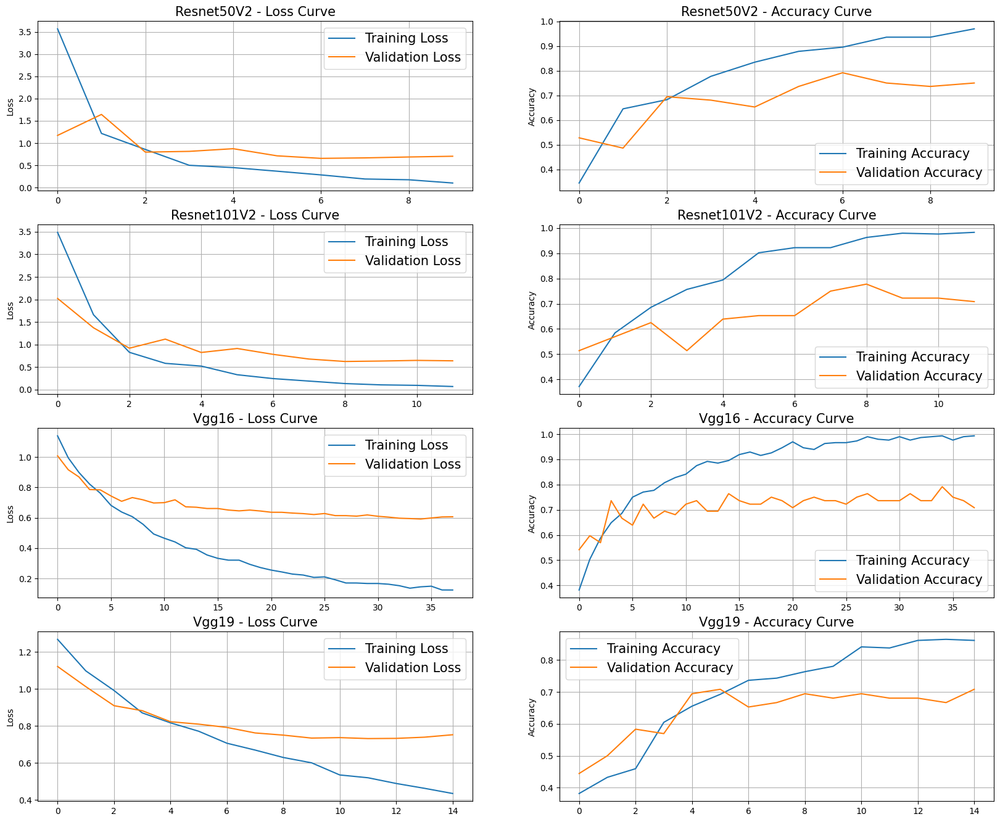

In [ ]:
# Plotting configurations
plt.figure(figsize=(20, 25))

# Iterate over the backbone histories.
index = 1
for name, history in zip(BACKBONE_NAMES, BACKBONE_HISTORIES):

    # subplot of the Backbone Learning curve.
    plt.subplot(6, 2, index)
    plt.title(name.strip().title() + " - Loss Curve", fontsize=15)
    plt.plot(history['loss'], label="Training Loss")
    plt.plot(history['val_loss'], label="Validation Loss")
    plt.ylabel("Loss")
    plt.legend(fontsize=15)
    plt.grid()

    plt.subplot(6, 2, index+1)
    plt.title(name.strip().title() + " - Accuracy Curve", fontsize=15)
    plt.plot(history['accuracy'], label="Training Accuracy")
    plt.plot(history['val_accuracy'], label="Validation Accuracy")
    plt.ylabel("Accuracy")
    plt.legend(fontsize=15)
    plt.grid()

    # update index
    index+=2

# show the final plot.
plt.savefig(f'{figure_dir}BackboneComparision-All.png')
plt.show()

All four architectures (ResNet50V2, ResNet101V2, VGG16, VGG19) show higher training accuracy, almost closer to 1.0. However, it stays between 0.7 and 0.8 when it comes to validation accuracy. VGG19 has just reached 0.7; therefore, I will look closer at the performance of   ResNet50V2, ResNet101V2 and VGG16.

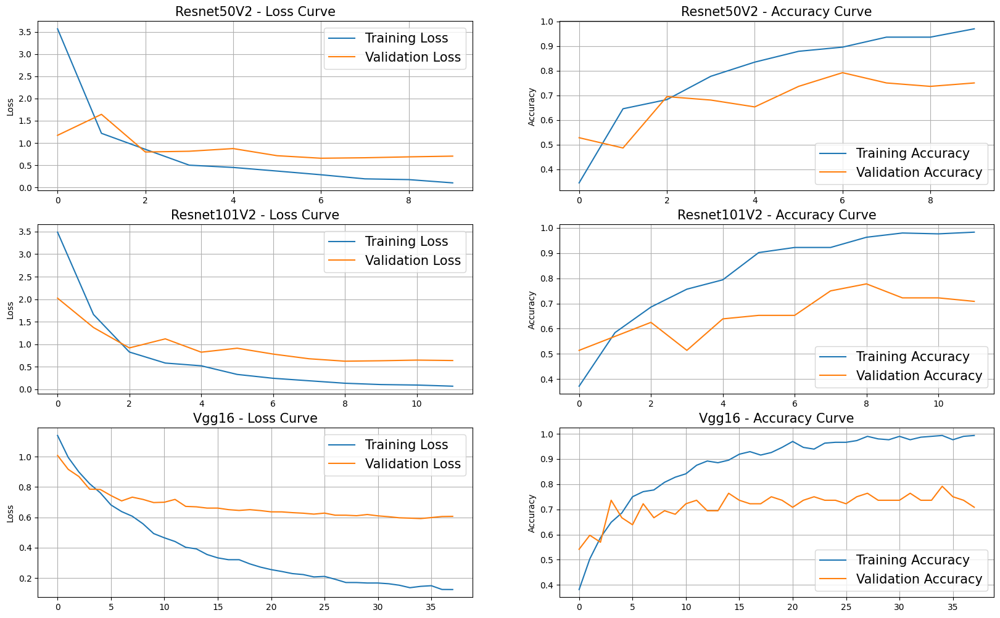

In [ ]:
# Name of the top 3 backbones.
TOP_3_BACKBONES = ['ResNet50V2', 'ResNet101V2',  'VGG16']

# Plotting configurations
plt.figure(figsize=(20, 25))

# Iterate over the backbone histories.
index = 1
for name, history in zip(BACKBONE_NAMES, BACKBONE_HISTORIES):

    if name in TOP_3_BACKBONES:
        # subplot of the Backbone Learning curve.
        plt.subplot(6, 2, index)
        plt.title(name.strip().title() + " - Loss Curve", fontsize=15)
        plt.plot(history['loss'], label="Training Loss")
        plt.plot(history['val_loss'], label="Validation Loss")
        plt.ylabel("Loss")
        plt.legend(fontsize=15)
        plt.grid()

        plt.subplot(6, 2, index+1)
        plt.title(name.strip().title() + " - Accuracy Curve", fontsize=15)
        plt.plot(history['accuracy'], label="Training Accuracy")
        plt.plot(history['val_accuracy'], label="Validation Accuracy")
        plt.ylabel("Accuracy")
        plt.legend(fontsize=15)
        plt.grid()

        # update index
        index+=2

# show the final plot.
plt.savefig(f'{figure_dir}BackboneComparision-Top3.png')
plt.show()

ResNet50V2 and ResNet101V2 efficiently optimized their functions in just 10 epochs, whereas VGG16 required approximately 35 epochs to achieve a similar level of optimization. Although all three architectures approached an accuracy of around 0.8, VGG16 exhibited a noticeable disparity between training accuracy and validation accuracy. Consequently, I have decided to delve deeper into the analysis of ResNet models.

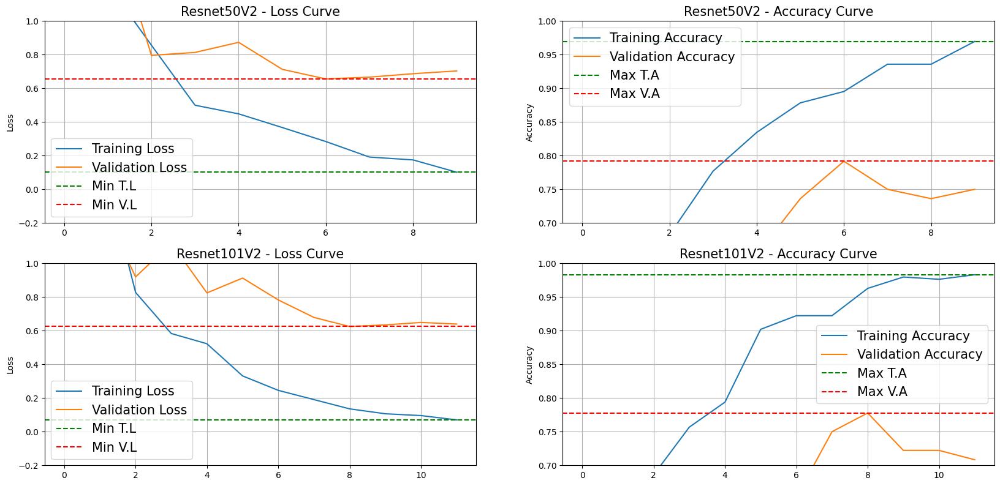

In [ ]:
# Name of the top 3 backbones.
TOP_3_BACKBONES = ['ResNet50V2', 'ResNet101V2']

# Plotting configurations
plt.figure(figsize=(20, 30))

# Iterate over the backbone histories.
index = 1
for name, history in zip(BACKBONE_NAMES, BACKBONE_HISTORIES):

    if name in TOP_3_BACKBONES:
        # subplot of the Backbone Learning curve.
        plt.subplot(6, 2, index)
        plt.title(name.strip().title() + " - Loss Curve", fontsize=15)
        plt.plot(history['loss'], label="Training Loss")
        plt.plot(history['val_loss'], label="Validation Loss")
        plt.axhline(y=min(history['loss']), label="Min T.L", color='g', linestyle='--')
        plt.axhline(y=min(history['val_loss']), label="Min V.L", color='r', linestyle='--')
        plt.ylabel("Loss")
        plt.legend(fontsize=15)
        plt.grid()
        plt.ylim(bottom=-0.2, top=1)

        plt.subplot(6, 2, index+1)
        plt.title(name.strip().title() + " - Accuracy Curve", fontsize=15)
        plt.plot(history['accuracy'], label="Training Accuracy")
        plt.plot(history['val_accuracy'], label="Validation Accuracy")
        plt.axhline(y=max(history['accuracy']), label="Max T.A", color='g', linestyle='--')
        plt.axhline(y=max(history['val_accuracy']), label="Max V.A", color='r', linestyle='--')
        plt.ylabel("Accuracy")
        plt.legend(fontsize=15)
        plt.grid()
        plt.ylim(bottom=0.7, top=1)

        # update index
        index+=2

# show the final plot.
plt.savefig(f'{figure_dir}BackboneComparision-Top2-CloseLook.png')
plt.show()

In [ ]:
# Using the best validation accuracy as baseline accuracy.
BASELINE_ACC = max(BACKBONE_HISTORIES[BACKBONE_NAMES.index('ResNet50V2')]['val_accuracy'])

# Similarly, using the best validation loss as the baseline loss.
BASELINE_LOSS = min(BACKBONE_HISTORIES[BACKBONE_NAMES.index('ResNet50V2')]['val_loss'])


print('--'*50)
print(" "*25 + f"ResNet Best Loss : {np.round(BASELINE_LOSS, decimals=4)}; Best Accuracy : {np.round(BASELINE_ACC, decimals=3)*100}%")
print('--'*50)

----------------------------------------------------------------------------------------------------
                         ResNet Best Loss : 0.6557; Best Accuracy : 79.2%
----------------------------------------------------------------------------------------------------


Upon a meticulous examination of loss and accuracy metrics between ResNet50V2 and ResNet101V2, it becomes evident that ResNet50V2 outperforms ResNet101V2 on the utilized dataset, as indicated by a best loss of 0.6557 and a best accuracy of 79.2%.

This experiment involved solely the replacement of the feature extraction layer through transfer learning, without training any weights, while maintaining fully connected layers akin to Model 01 (CNN from scratch). For Model 01, constructed from scratch, the loss stands at 0.4394 with an accuracy of 0.7916. In contrast, Model 02, employing transfer learning, exhibits a loss of 0.6557 and an accuracy of 0.792. Surprisingly, despite Model 02 boasting a more intricate architecture with heightened feature extraction capabilities, Model 01 appears to outperform it.

This discrepancy in performance could potentially be attributed to the fully connected (FC) layer utilized in Model 02. The FC layer was fine-tuned using Keras Tuner for Model 01. To validate this hypothesis, the next step involves redesigning the FC layer of Model 02 using Keras Tuner.

## Optimise FC Layers of Model 02

In [ ]:
def build_ResNet_model(hp):

    # Backbone
    backbone = tka.ResNet50V2(include_top=False, weights='imagenet', input_shape=(*IMAGE_SIZE, 3))
    backbone.trainable = False

    # Base Model
    model = keras.Sequential(layers=[
        layers.InputLayer(input_shape=(*IMAGE_SIZE, 3), name="InputLayer"),
        backbone,
        layers.Flatten()
    ], name='ResNet50V2')

    # Params to tweak
    for i in range(hp.Choice('n_layers', [1,2,4])):
        model.add(layers.Dense(hp.Choice(f'{i+1}_units', [64, 256, 512]), activation='relu'))
    model.add(layers.Dropout(hp.Choice('rate', [0.2,0.4])))

    # Output layer
    model.add(layers.Dense(n_classes, activation='softmax'))

    # Compile the model.
    model.compile(
        loss='categorical_crossentropy',
        optimizer=keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),
        metrics=['accuracy']
    )

    return model

In [ ]:
# Initialize tuner
tuner = kt.RandomSearch(hypermodel=build_ResNet_model, objective='val_loss', project_name='cnn_model_02_V3')

# Start hyperparameter search.
tuner.search(
    train_dataset,
    validation_data=validation_dataset,
    epochs = 10
)

Trial 10 Complete [00h 01m 01s]
val_loss: 0.6491687297821045

Best val_loss So Far: 0.6491687297821045
Total elapsed time: 00h 09m 48s


In [ ]:
best_model02_hps = tuner.oracle.get_best_trials(num_trials=1)[0].hyperparameters.values


for key, value in best_model02_hps.items():
    print(f"{key}: {value}")

n_layers: 4
1_units: 256
rate: 0.2
learning_rate: 0.0001
2_units: 256
3_units: 512
4_units: 256


In [ ]:
model_02 = tuner.get_best_models()[0]
model_02.build(input_shape=(*IMAGE_SIZE, 3))
# Best Model Summary
model_02.summary()

Model: "ResNet50V2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 7, 7, 2048)        23564800  
                                                                 
 flatten (Flatten)           (None, 100352)            0         
                                                                 
 dense (Dense)               (None, 256)               25690368  
                                                                 
 dense_1 (Dense)             (None, 256)               65792     
                                                                 
 dense_2 (Dense)             (None, 512)               131584    
                                                                 
 dense_3 (Dense)             (None, 256)               131328    
                                                                 
 dropout (Dropout)           (None, 256)               0

In [ ]:
# Training the model
model_02_history = model_02.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=100,
    callbacks = [
        callbacks.EarlyStopping(patience=5, restore_best_weights=True),
        callbacks.ModelCheckpoint(f'{model_dir}model_02.h5', save_best_only=True),
        callbacks.TensorBoard(f'{tensorboard_log_dir}{datetime.datetime.now().strftime("%Y%m%d-%H%M%S")}', histogram_freq=1)
    ]
)

Epoch 1/100
3/3 [==============================] - ETA: 0s - loss: 0.0915 - accuracy: 0.9899

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


3/3 [==============================] - 35s 13s/step - loss: 0.0915 - accuracy: 0.9899 - val_loss: 0.6729 - val_accuracy: 0.7917
Epoch 2/100
3/3 [==============================] - 18s 9s/step - loss: 0.0542 - accuracy: 0.9932 - val_loss: 0.7196 - val_accuracy: 0.7778
Epoch 3/100
3/3 [==============================] - 18s 8s/step - loss: 0.0280 - accuracy: 1.0000 - val_loss: 0.8306 - val_accuracy: 0.7083
Epoch 4/100
3/3 [==============================] - 16s 8s/step - loss: 0.0241 - accuracy: 1.0000 - val_loss: 0.8723 - val_accuracy: 0.7083
Epoch 5/100
3/3 [==============================] - 16s 8s/step - loss: 0.0121 - accuracy: 1.0000 - val_loss: 0.9011 - val_accuracy: 0.7083
Epoch 6/100
3/3 [==============================] - 16s 7s/step - loss: 0.0098 - accuracy: 0.9966 - val_loss: 0.9188 - val_accuracy: 0.7222


In [ ]:
# Valid Data
score = model_02.evaluate(validation_dataset)

print('Validation loss:', score[0])
print('Validation accuracy:', score[1])

1/1 [==============================] - 1s 829ms/step - loss: 0.6729 - accuracy: 0.7917
Validation loss: 0.6728706955909729
Validation accuracy: 0.7916666865348816


In [ ]:
# Test data
score = model_02.evaluate(test_dataset)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

3/3 [==============================] - 6s 2s/step - loss: 0.1692 - accuracy: 0.9511
Test loss: 0.16922587156295776
Test accuracy: 0.9510869383811951


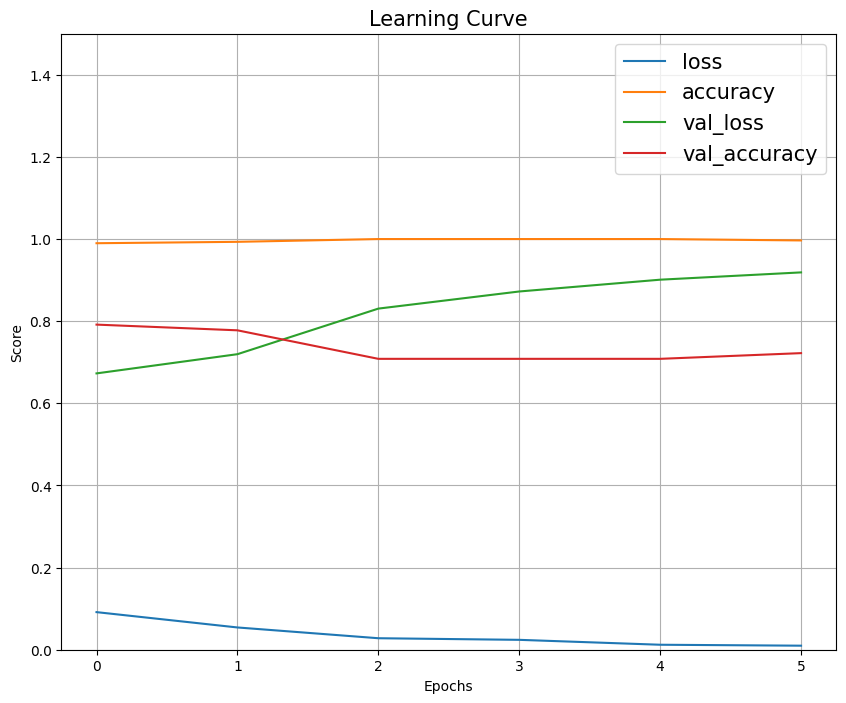

In [ ]:
pd.DataFrame(model_02_history.history).plot(figsize=(10,8))
plt.title("Learning Curve", fontsize=15)
plt.legend(fontsize=15)
plt.ylim([0,1.5])
plt.ylabel('Score')
plt.xlabel('Epochs')
plt.grid()
plt.show()

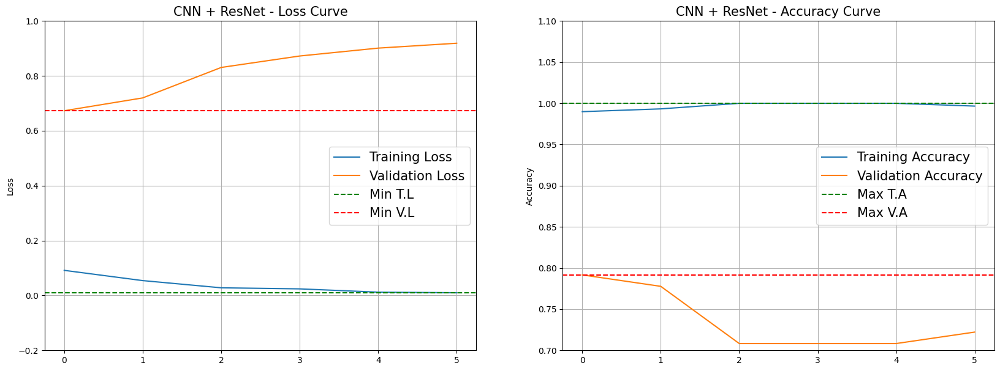

In [ ]:
# Plotting configurations
plt.figure(figsize=(20, 7))

# subplot of the Backbone Learning curve.
plt.subplot(1, 2, 1)
plt.title("CNN + ResNet - Loss Curve", fontsize=15)
plt.plot(model_02_history.history['loss'], label="Training Loss")
plt.plot(model_02_history.history['val_loss'], label="Validation Loss")
plt.axhline(y=min(model_02_history.history['loss']), label="Min T.L", color='g', linestyle='--')
plt.axhline(y=min(model_02_history.history['val_loss']), label="Min V.L", color='r', linestyle='--')
plt.ylabel("Loss")
plt.legend(fontsize=15)
plt.grid()
plt.ylim(bottom=-0.2, top=1)

plt.subplot(1, 2, 2)
plt.title("CNN + ResNet - Accuracy Curve", fontsize=15)
plt.plot(model_02_history.history['accuracy'], label="Training Accuracy")
plt.plot(model_02_history.history['val_accuracy'], label="Validation Accuracy")
plt.axhline(y=max(model_02_history.history['accuracy']), label="Max T.A", color='g', linestyle='--')
plt.axhline(y=max(model_02_history.history['val_accuracy']), label="Max V.A", color='r', linestyle='--')
plt.ylabel("Accuracy")
plt.legend(fontsize=15)
plt.grid()
plt.ylim(bottom=0.7, top=1.1)


# show the final plot.
plt.savefig(f'{figure_dir}CNN_LOSS_and_Accuracy.png')
plt.show()

## **Conclusion** - Model 02

Optimising FC layers with Model 02 performed better, reaching an accuracy of 0.791.  This brings us to the following conclusions,

1. Model 01 and Model 02 both performed equally well with similar accuracy. Model architectures do not influence accuracy anymore with the given dataset.
2. Both the models reach 100% accuracy in training but fail to reach higher accuracy for validation data. The gap between training and validation infers issues with the generalization of the prediction function.

Issues with generalization can be addressed using the following techniques.
* Use of simple model
* Getting more training data

In this scenario, it points to a lack of training data (300+ and each class with 100). Therefore as a next step, I will be increasing training data using image augmentation.

# Create New Samples by Augmentation


In [ ]:
def load_and_preprocess_image(img_path, target_size, target_location):
    # Load the image from the file path
    img = Image.open(img_path)

    # Save orginal image to target destination
    img.save(target_location)

    # Resize the image to the target size
    img = img.resize(target_size)

    # Convert the image to a numpy array
    img_array = np.array(img)

    # Normalize pixel values to be between 0 and 1
    img_array = img_array / 255.0

    return img_array


# Create a data generator with augmentation options
datagenAugmented = ImageDataGenerator(
    rotation_range=20,  # Data augmentation options
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest')

# Create directories to store augmented images
os.makedirs(augmented_dataset_path, exist_ok=True)

# Specify the target number of augmented images
target_augmented_images = 5

for root, dirs, files in os.walk(original_dataset_path):
    for file in files:
        class_folder = os.path.join(augmented_dataset_path, os.path.basename(root))
        os.makedirs(class_folder, exist_ok=True)

        img_path = os.path.join(root, file)
        # Load the image from file path

        target_location = os.path.join(class_folder, file)
        img_array = load_and_preprocess_image(img_path, IMAGE_SIZE, target_location)

        # Reshape the image to (1, height, width, channels) for the flow method
        img_array = img_array.reshape((1,) + img_array.shape)

        # Augment and save images until reaching the target number
        generated_images_count = 0
        # Generate augmented images until reaching the target count
        for batch in datagenAugmented.flow(img_array, batch_size=1, save_to_dir=class_folder, save_prefix='aug', save_format='jpg'):
            generated_images_count += 1
            if generated_images_count >= target_augmented_images:
                break



In [ ]:

def count_files_in_subfolders(root_folder):
    subfolders = [f.path for f in os.scandir(root_folder) if f.is_dir()]

    subfolder_info = {}
    for subfolder in subfolders:
        # Get the subfolder name
        subfolder_name = os.path.basename(subfolder)

        # Count the number of files in the subfolder
        num_files = sum([1 for file in os.listdir(subfolder) if os.path.isfile(os.path.join(subfolder, file))])

        # Store the information in a dictionary
        subfolder_info[subfolder_name] = num_files

    return subfolder_info


result = count_files_in_subfolders(augmented_dataset_path)

# Print the result
for subfolder, num_files in result.items():
    print(f"Subfolder: {subfolder}, Number of Files: {num_files}")

Subfolder: algal leaf, Number of Files: 654
Subfolder: brown blight, Number of Files: 661
Subfolder: white spot, Number of Files: 826


## Rerun the Model 01 and Model 02 with Augmented Data

### Split data Training+ validation and Testing folders

In [ ]:
dataset_path = augmented_dataset_path
# Create a DataFrame with columns 'image_path' and 'label'
data = {'image_path': [], 'label': []}

# Iterate through subfolders and collect image paths and labels
for label, class_folder in enumerate(os.listdir(dataset_path)):
    class_path = os.path.join(dataset_path, class_folder)
    if os.path.isdir(class_path):
        for image_file in os.listdir(class_path):
            if image_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                data['image_path'].append(os.path.join(class_path, image_file))
                data['label'].append(class_folder)

# Create DataFrame
df = pd.DataFrame(data)

In [ ]:
df['label'].value_counts()

brown blight    661
algal leaf      654
white spot      358
Name: label, dtype: int64

In [ ]:
# Split the DataFrame into training, validation, and test sets
train_df, val_df = train_test_split(df, test_size=0.3, stratify=df['label'], random_state=42)
val_df, test_df = train_test_split(val_df, test_size=0.5, stratify=val_df['label'], random_state=42)

# Display the sizes of the sets
print(f"Training set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

Training set size: 1171
Validation set size: 251
Test set size: 251


In [ ]:

# Define the paths for the new folders
output_train_path = '/content/gdrive/MyDrive/DS5104/FinalAssignment01/Data_A1_Train_Val_Test_V2/train/'
output_val_path = '/content/gdrive/MyDrive/DS5104/FinalAssignment01/Data_A1_Train_Val_Test_V2/validation/'
output_test_path = '/content/gdrive/MyDrive/DS5104/FinalAssignment01/Data_A1_Train_Val_Test_V2/test/'

# Create the output folders if they don't exist
os.makedirs(output_train_path, exist_ok=True)
os.makedirs(output_val_path, exist_ok=True)
os.makedirs(output_test_path, exist_ok=True)

# Function to copy images to the specified folder
def copy_images(df, output_folder):
    for index, row in df.iterrows():
        image_path = row['image_path']
        label = row['label']
        output_label_folder = os.path.join(output_folder, str(label))
        os.makedirs(output_label_folder, exist_ok=True)
        shutil.copy(image_path, output_label_folder)

# Copy training images
copy_images(train_df, output_train_path)

# Copy validation images
copy_images(val_df, output_val_path)

# Copy test images
copy_images(test_df, output_test_path)

print("Data split and saved into separate folders.")

Data split and saved into separate folders.


In [ ]:
source_path = "/content/gdrive/MyDrive/DS5104/FinalAssignment01/Data_A1_Train_Val_Test_V2"
destination_path = "/content/Data_A1_Train_Val_Test"

shutil.copytree(source_path, destination_path, dirs_exist_ok=True)

'/content/Data_A1_Train_Val_Test'

In [ ]:
train_path = '/content/Data_A1_Train_Val_Test/train/'
val_path = '/content/Data_A1_Train_Val_Test/validation/'
test_path = '/content/Data_A1_Train_Val_Test/test/'

In [ ]:
# Preprocessing
# Augmentation is essential due to the number of images in the dataset.
# Preprocessing of images will be used if required based on initial accuracy.
datagen = ImageDataGenerator(rescale=1.0 / 255,  # Normalize pixel values to [0, 1]
                            #rotation_range=20,  # Data augmentation options
                            #width_shift_range=0.2,
                            #height_shift_range=0.2,
                            #shear_range=0.2,
                            #zoom_range=0.2,
                            #horizontal_flip=True,
                            #vertical_flip=True,
                            #validation_split=0.2,
                            fill_mode='nearest')

In [ ]:
# Dataload for Training, validation, and testing
train_dataset = datagen.flow_from_directory(train_path,
                                            target_size=IMAGE_SIZE,
                                            batch_size=BATCH_SIZE,
                                            shuffle=True,
                                            color_mode='rgb',
                                            class_mode='categorical'
                                            )

validation_dataset = datagen.flow_from_directory(val_path,
                                                 target_size=IMAGE_SIZE,
                                                 batch_size=BATCH_SIZE,
                                                 shuffle=True,
                                                 color_mode='rgb',
                                                 class_mode='categorical'
                                                 )

test_dataset = datagen.flow_from_directory(test_path,
                                           target_size=IMAGE_SIZE,
                                           batch_size=BATCH_SIZE,
                                           color_mode='rgb',
                                           class_mode='categorical'
                                           )

Found 1171 images belonging to 3 classes.
Found 251 images belonging to 3 classes.
Found 251 images belonging to 3 classes.


In [ ]:
class_labels = list(train_dataset.class_indices.keys())
n_classes = train_dataset.num_classes
print(f'Classes: {class_labels}')
print(f'No of classes: {n_classes}')

Classes: ['algal leaf', 'brown blight', 'white spot']
No of classes: 3


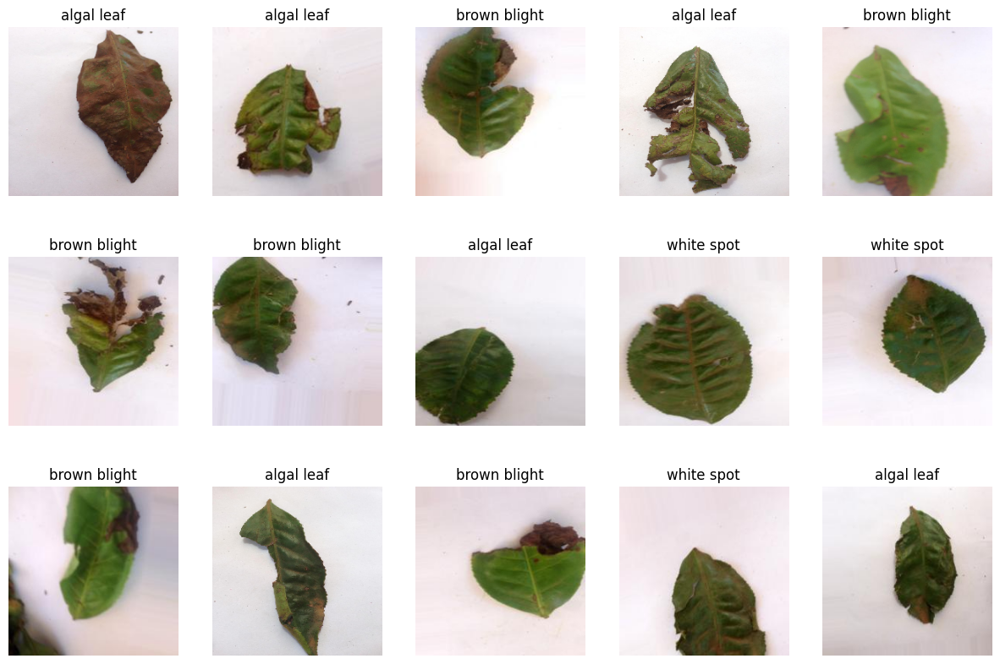

In [ ]:
# Plot a batch of preprocessed images (for visualization)
images, labels = next(train_dataset)
plt.figure(figsize=(15, 10))
for i in range(15):
    plt.subplot(3, 5, i + 1)
    plt.imshow(images[i])
    plt.title(class_labels[np.argmax(labels[i])])
    plt.axis('off')

cls()

In [ ]:
# Run only if model required to be reloaded
model_01 = load_model(f'{model_dir}model_01.h5')

In [ ]:
# Training the model
model_01_history = model_01.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=100,
    callbacks = [
        callbacks.EarlyStopping(patience=5, restore_best_weights=True),
        callbacks.ModelCheckpoint(f'{model_dir}model_01_v2.h5', save_best_only=True),
        callbacks.TensorBoard(f'{tensorboard_log_dir}{datetime.datetime.now().strftime("%Y%m%d-%H%M%S")}', histogram_freq=1)
    ]
)

Epoch 1/100
10/10 [==============================] - ETA: 0s - loss: 1.0601 - accuracy: 0.5756

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


10/10 [==============================] - 61s 6s/step - loss: 1.0601 - accuracy: 0.5756 - val_loss: 0.8978 - val_accuracy: 0.5936
Epoch 2/100
10/10 [==============================] - 7s 654ms/step - loss: 0.8654 - accuracy: 0.6080 - val_loss: 0.8213 - val_accuracy: 0.6653
Epoch 3/100
10/10 [==============================] - 7s 657ms/step - loss: 0.7835 - accuracy: 0.6635 - val_loss: 0.7962 - val_accuracy: 0.6853
Epoch 4/100
10/10 [==============================] - 7s 658ms/step - loss: 0.7534 - accuracy: 0.6874 - val_loss: 0.7499 - val_accuracy: 0.6972
Epoch 5/100
10/10 [==============================] - 7s 646ms/step - loss: 0.7165 - accuracy: 0.7139 - val_loss: 0.7835 - val_accuracy: 0.6733
Epoch 6/100
10/10 [==============================] - 7s 658ms/step - loss: 0.6920 - accuracy: 0.7105 - val_loss: 0.7065 - val_accuracy: 0.7291
Epoch 7/100
10/10 [==============================] - 7s 663ms/step - loss: 0.6409 - accuracy: 0.7421 - val_loss: 0.6944 - val_accuracy: 0.7371
Epoch 8/100
1

In [ ]:
# Valid Data
score = model_01.evaluate(validation_dataset)

print('Validation loss:', score[0])
print('Validation accuracy:', score[1])

2/2 [==============================] - 1s 264ms/step - loss: 0.5289 - accuracy: 0.7570
Validation loss: 0.528907060623169
Validation accuracy: 0.7569721341133118


In [ ]:
# Test data
score = model_01.evaluate(test_dataset)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

2/2 [==============================] - 1s 227ms/step - loss: 0.6271 - accuracy: 0.7490
Test loss: 0.6270857453346252
Test accuracy: 0.7490040063858032


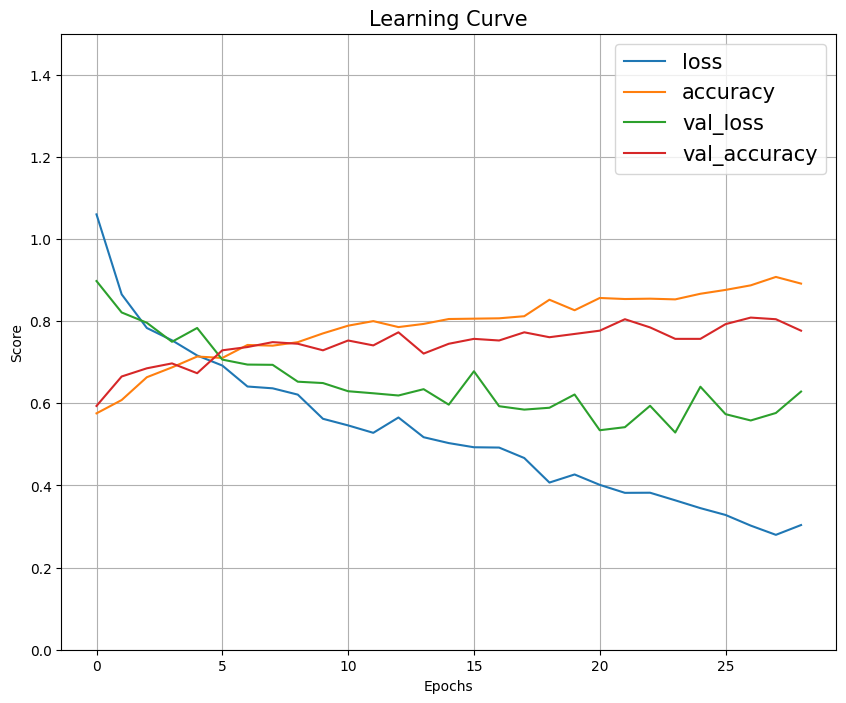

In [ ]:
pd.DataFrame(model_01_history.history).plot(figsize=(10,8))
plt.title("Learning Curve", fontsize=15)
plt.legend(fontsize=15)
plt.ylim([0,1.5])
plt.ylabel('Score')
plt.xlabel('Epochs')
plt.grid()
plt.show()

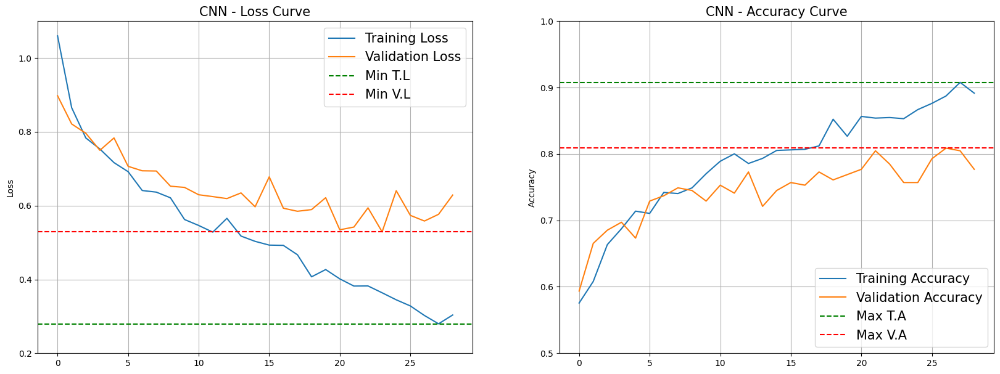

In [ ]:
# Plotting configurations
plt.figure(figsize=(20, 7))

# subplot of the Backbone Learning curve.
plt.subplot(1, 2, 1)
plt.title("CNN - Loss Curve", fontsize=15)
plt.plot(model_01_history.history['loss'], label="Training Loss")
plt.plot(model_01_history.history['val_loss'], label="Validation Loss")
plt.axhline(y=min(model_01_history.history['loss']), label="Min T.L", color='g', linestyle='--')
plt.axhline(y=min(model_01_history.history['val_loss']), label="Min V.L", color='r', linestyle='--')
plt.ylabel("Loss")
plt.legend(fontsize=15)
plt.grid()
plt.ylim(bottom=0.2, top=1.1)

plt.subplot(1, 2, 2)
plt.title("CNN - Accuracy Curve", fontsize=15)
plt.plot(model_01_history.history['accuracy'], label="Training Accuracy")
plt.plot(model_01_history.history['val_accuracy'], label="Validation Accuracy")
plt.axhline(y=max(model_01_history.history['accuracy']), label="Max T.A", color='g', linestyle='--')
plt.axhline(y=max(model_01_history.history['val_accuracy']), label="Max V.A", color='r', linestyle='--')
plt.ylabel("Accuracy")
plt.legend(fontsize=15)
plt.grid()
plt.ylim(bottom=0.5, top=1.0)


# show the final plot.
plt.savefig(f'{figure_dir}CNN_LOSS_and_Accuracy.png')
plt.show()

## Model 02

In [ ]:
# Run only if model required to be reloaded
model_02 = load_model(f'{model_dir}model_02.h5')

In [ ]:
# Training the model
model_02_history = model_02.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=100,
    callbacks = [
        callbacks.EarlyStopping(patience=5, restore_best_weights=True),
        callbacks.ModelCheckpoint(f'{model_dir}model_02_v2.h5', save_best_only=True),
        callbacks.TensorBoard(f'{tensorboard_log_dir}{datetime.datetime.now().strftime("%Y%m%d-%H%M%S")}', histogram_freq=1)
    ]
)

Epoch 1/100
10/10 [==============================] - ETA: 0s - loss: 0.7439 - accuracy: 0.7062

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


10/10 [==============================] - 38s 3s/step - loss: 0.7439 - accuracy: 0.7062 - val_loss: 0.5600 - val_accuracy: 0.7649
Epoch 2/100
10/10 [==============================] - 12s 1s/step - loss: 0.2791 - accuracy: 0.9035 - val_loss: 0.4259 - val_accuracy: 0.8367
Epoch 3/100
10/10 [==============================] - 11s 1s/step - loss: 0.1043 - accuracy: 0.9710 - val_loss: 0.3670 - val_accuracy: 0.8566
Epoch 4/100
10/10 [==============================] - 11s 1s/step - loss: 0.0424 - accuracy: 0.9923 - val_loss: 0.3315 - val_accuracy: 0.8845
Epoch 5/100
10/10 [==============================] - 10s 1s/step - loss: 0.0156 - accuracy: 1.0000 - val_loss: 0.4072 - val_accuracy: 0.8685
Epoch 6/100
10/10 [==============================] - 10s 994ms/step - loss: 0.0076 - accuracy: 1.0000 - val_loss: 0.3554 - val_accuracy: 0.8884
Epoch 7/100
10/10 [==============================] - 10s 1s/step - loss: 0.0039 - accuracy: 1.0000 - val_loss: 0.3541 - val_accuracy: 0.8805
Epoch 8/100
10/10 [===

In [ ]:
# Valid Data
score = model_02.evaluate(validation_dataset)

print('Validation loss:', score[0])
print('Validation accuracy:', score[1])

2/2 [==============================] - 1s 311ms/step - loss: 0.3315 - accuracy: 0.8845
Validation loss: 0.3315347731113434
Validation accuracy: 0.8844621777534485


In [ ]:
# Test data
score = model_02.evaluate(test_dataset)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

2/2 [==============================] - 1s 313ms/step - loss: 0.4513 - accuracy: 0.8327
Test loss: 0.4513291120529175
Test accuracy: 0.8326693177223206


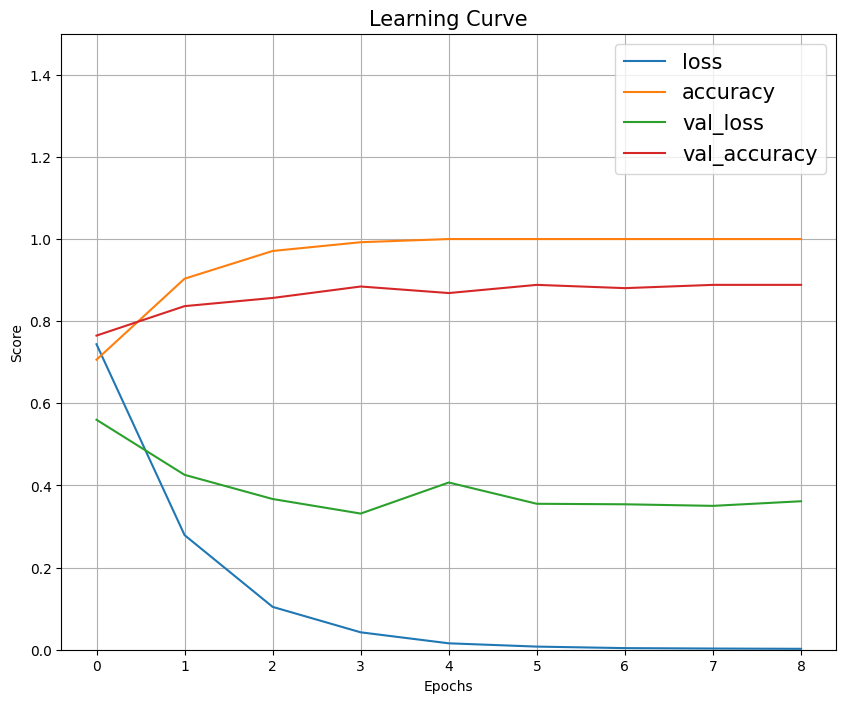

In [ ]:
pd.DataFrame(model_02_history.history).plot(figsize=(10,8))
plt.title("Learning Curve", fontsize=15)
plt.legend(fontsize=15)
plt.ylim([0,1.5])
plt.ylabel('Score')
plt.xlabel('Epochs')
plt.grid()
plt.show()

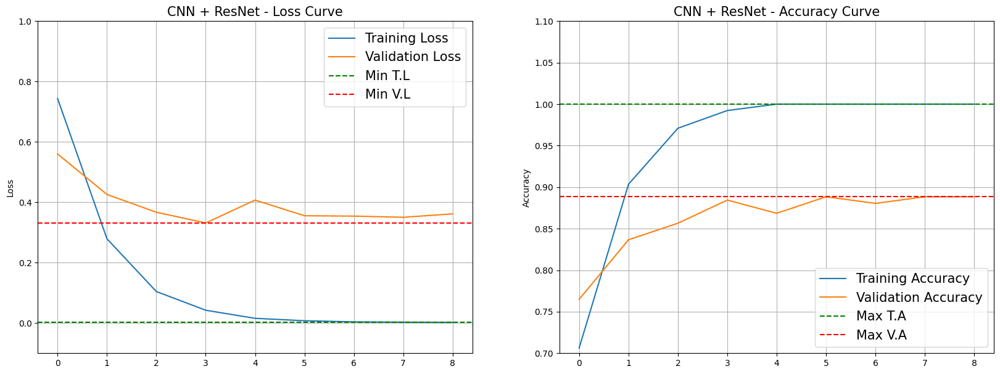

In [ ]:
# Plotting configurations
plt.figure(figsize=(20, 7))

# subplot of the Backbone Learning curve.
plt.subplot(1, 2, 1)
plt.title("CNN + ResNet - Loss Curve", fontsize=15)
plt.plot(model_02_history.history['loss'], label="Training Loss")
plt.plot(model_02_history.history['val_loss'], label="Validation Loss")
plt.axhline(y=min(model_02_history.history['loss']), label="Min T.L", color='g', linestyle='--')
plt.axhline(y=min(model_02_history.history['val_loss']), label="Min V.L", color='r', linestyle='--')
plt.ylabel("Loss")
plt.legend(fontsize=15)
plt.grid()
plt.ylim(bottom=-0.1, top=1)

plt.subplot(1, 2, 2)
plt.title("CNN + ResNet - Accuracy Curve", fontsize=15)
plt.plot(model_02_history.history['accuracy'], label="Training Accuracy")
plt.plot(model_02_history.history['val_accuracy'], label="Validation Accuracy")
plt.axhline(y=max(model_02_history.history['accuracy']), label="Max T.A", color='g', linestyle='--')
plt.axhline(y=max(model_02_history.history['val_accuracy']), label="Max V.A", color='r', linestyle='--')
plt.ylabel("Accuracy")
plt.legend(fontsize=15)
plt.grid()
plt.ylim(bottom=0.7, top=1.1)


# show the final plot.
plt.savefig(f'{figure_dir}CNN_LOSS_and_Accuracy.png')
plt.show()

## **Conclusion** - Model 01 / Model 02 with Augmented Data

As anticipated, the inclusion of more data proved beneficial in narrowing the gap between training and validation accuracy.

For Model 01, the validation accuracy declined from 0.7916 to 0.7570. However, this validation accuracy encompasses both training and testing (0.7490) accuracies, indicating potential enhancements in model architectures for superior outcomes.

This notion is substantiated by the performance of Model 02, which achieved a validation accuracy of 0.8845 and a testing accuracy of 0.8327. Leveraging the ResNet50V2 feature extraction capabilities, characterized by its intricate architecture, and utilizing improved datasets, Model 02 outperformed all trained models.

In conclusion, this exercise underscores two key insights:

1.	Transfer learning plays a pivotal role in feature extraction, enabling the rapid development of machine learning models with heightened accuracy.

2.	The volume of images in the training dataset significantly influences model performance, particularly concerning generalization. In the realm of computer vision, employing techniques such as image data augmentation and pre-processing proves instrumental in expanding and diversifying the training dataset.


## TensorBoard

In [ ]:
%tensorboard --logdir /content/gdrive/MyDrive/DS5104/FinalAssignment01/Log --port=6005

<IPython.core.display.Javascript object>